**Import Necessary libraries**

In [1]:
# Import all the libraries which will be needed later
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

from sklearn.impute import SimpleImputer
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score, mean_squared_error, median_absolute_error
from sklearn.ensemble import RandomForestRegressor
from sklearn.utils import shuffle

%matplotlib inline

from sklearn.preprocessing import OneHotEncoder
from sklearn.compose import ColumnTransformer

In [2]:
df_calendar = pd.read_csv("calendar.csv", low_memory=False)
df_listings = pd.read_csv("listings.csv", low_memory=False)
df_reviews = pd.read_csv("reviews.csv", low_memory=False)

**Data Exploration**

**Explore "calendar.csv data set"**

In [ ]:
df_calendar.info()

In [236]:
df_calendar.shape

(4793882, 7)

In [237]:
df_calendar.head(4)

,listing_id,date,available,price,adjusted_price,minimum_nights,maximum_nights
0,3176,2023-09-16,f,$83.00,$83.00,63,184
1,3176,2023-09-17,f,$83.00,$83.00,63,184
2,3176,2023-09-18,f,$83.00,$83.00,63,184
3,3176,2023-09-19,f,$83.00,$83.00,63,184


In [238]:
df_calendar.describe()

,listing_id,minimum_nights,maximum_nights
count,4.793882e+06,4.793882e+06,4.793882e+06
mean,2.394923e+17,4.752509e+01,1.145296e+06
std,3.722621e+17,6.531080e+01,4.956393e+07
min,3.176000e+03,1.000000e+00,1.000000e+00
25%,1.651334e+07,2.000000e+00,3.650000e+02
50%,3.741502e+07,7.000000e+00,1.125000e+03
75%,6.505862e+17,9.200000e+01,1.125000e+03
max,9.811597e+17,1.100000e+03,2.147484e+09


In [191]:
df_calendar.nunique()

listing_id        13134
date                365
available             2
price              1998
adjusted_price     2017
minimum_nights      112
maximum_nights      315
dtype: int64

In [192]:
# Check for missing values in each column
missing_values_per_column = df_calendar.isnull().sum()

# Print the results
print("Missing values per column:")
print(missing_values_per_column)

Missing values per column:
listing_id        0
date              0
available         0
price             0
adjusted_price    0
minimum_nights    0
maximum_nights    0
dtype: int64


In [193]:
df_calendar.duplicated().sum()

0

**To do:**

- Drop feature 'adjusted_price'.
- The feature 'price' needs to be converted to numerical value
- The feature 'date' needs to be converted to datetime format
- The feature 'available' needs to be converted into Boolean data type

**explore the data set "listings.csv"**

In [194]:
# Take a look at a concise summary of the DataFrame 'listings'
df_listings.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13134 entries, 0 to 13133
Data columns (total 75 columns):
 #   Column                                        Non-Null Count  Dtype  
---  ------                                        --------------  -----  
 0   id                                            13134 non-null  int64  
 1   listing_url                                   13134 non-null  object 
 2   scrape_id                                     13134 non-null  int64  
 3   last_scraped                                  13134 non-null  object 
 4   source                                        13134 non-null  object 
 5   name                                          13134 non-null  object 
 6   description                                   12997 non-null  object 
 7   neighborhood_overview                         6771 non-null   object 
 8   picture_url                                   13134 non-null  object 
 9   host_id                                       13134 non-null 

In [195]:
#check to know the number of rows and columns
df_listings.shape

(13134, 75)

In [196]:
df_listings.duplicated().sum()

0

In [197]:
# Show the first 4 rows of the data set
df_listings.head(4)

,id,listing_url,scrape_id,last_scraped,source,name,description,neighborhood_overview,picture_url,host_id,...,review_scores_communication,review_scores_location,review_scores_value,license,instant_bookable,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month
0,3176,https://www.airbnb.com/rooms/3176,20230916061000,2023-09-16,city scrape,Rental unit in Berlin · ★4.63 · 1 bedroom · 2 ...,This beautiful first floor apartment is situa...,The neighbourhood is famous for its variety of...,https://a0.muscache.com/pictures/243355/84afcf...,3718,...,4.69,4.92,4.62,First name and Last name: Nicolas Krotz <br/> ...,f,1,1,0,0,0.85
1,9991,https://www.airbnb.com/rooms/9991,20230916061000,2023-09-16,city scrape,Rental unit in Berlin · ★5.0 · 4 bedrooms · 7 ...,4 bedroom with very large windows and outstand...,Prenzlauer Berg is an amazing neighbourhood wh...,https://a0.muscache.com/pictures/42799131/59c8...,33852,...,5.00,4.86,4.86,03/Z/RA/003410-18,f,1,1,0,0,0.08
2,14325,https://www.airbnb.com/rooms/14325,20230916061000,2023-09-16,city scrape,Rental unit in Berlin · ★4.67 · Studio · 1 bed...,The apartment is located on the upper second f...,NaN,https://a0.muscache.com/pictures/508703/24988a...,55531,...,4.84,4.58,4.42,NaN,f,4,4,0,0,0.16
3,16644,https://www.airbnb.com/rooms/16644,20230916061000,2023-09-16,city scrape,Condo in Berlin · ★4.72 · 1 bedroom · 1 bed · ...,Light and sunny 2-Room-turn of the century-fla...,Our Part of Kreuzberg is just the best. Good v...,https://a0.muscache.com/pictures/73759174/e2ef...,64696,...,4.86,4.67,4.71,NaN,f,2,2,0,0,0.30


In [198]:
# Count distinct observations per feature
df_listings.nunique()

id                                              13134
listing_url                                     13134
scrape_id                                           1
last_scraped                                        1
source                                              2
                                                ...  
calculated_host_listings_count                     36
calculated_host_listings_count_entire_homes        32
calculated_host_listings_count_private_rooms       17
calculated_host_listings_count_shared_rooms        12
reviews_per_month                                 686
Length: 75, dtype: int64

In [199]:
# Check for missing values in each column
missing_values_per_column = df_listings.isnull().sum()

# Print the results
print("Missing values per column:")
print(missing_values_per_column)

Missing values per column:
id                                                 0
listing_url                                        0
scrape_id                                          0
last_scraped                                       0
source                                             0
                                                ... 
calculated_host_listings_count                     0
calculated_host_listings_count_entire_homes        0
calculated_host_listings_count_private_rooms       0
calculated_host_listings_count_shared_rooms        0
reviews_per_month                               2756
Length: 75, dtype: int64


In [37]:
# Another way to check for missing values
for column in df_listings.columns:
    missing_values_count = df_listings[column].isnull().sum()
    print(f"Column {column} has {missing_values_count} missing values.")


Column id has 0 missing values.
Column listing_url has 0 missing values.
Column scrape_id has 0 missing values.
Column last_scraped has 0 missing values.
Column source has 0 missing values.
Column name has 0 missing values.
Column description has 137 missing values.
Column neighborhood_overview has 6363 missing values.
Column picture_url has 0 missing values.
Column host_id has 0 missing values.
Column host_url has 0 missing values.
Column host_name has 9 missing values.
Column host_since has 9 missing values.
Column host_location has 2288 missing values.
Column host_about has 6328 missing values.
Column host_response_time has 4869 missing values.
Column host_response_rate has 4869 missing values.
Column host_acceptance_rate has 4089 missing values.
Column host_is_superhost has 83 missing values.
Column host_thumbnail_url has 9 missing values.
Column host_picture_url has 9 missing values.
Column host_neighbourhood has 6636 missing values.
Column host_listings_count has 9 missing values

In [38]:
# check to see the features
columns_list = df_listings.columns

# Print or display the column names
print(columns_list)


Index(['id', 'listing_url', 'scrape_id', 'last_scraped', 'source', 'name',
       'description', 'neighborhood_overview', 'picture_url', 'host_id',
       'host_url', 'host_name', 'host_since', 'host_location', 'host_about',
       'host_response_time', 'host_response_rate', 'host_acceptance_rate',
       'host_is_superhost', 'host_thumbnail_url', 'host_picture_url',
       'host_neighbourhood', 'host_listings_count',
       'host_total_listings_count', 'host_verifications',
       'host_has_profile_pic', 'host_identity_verified', 'neighbourhood',
       'neighbourhood_cleansed', 'neighbourhood_group_cleansed', 'latitude',
       'longitude', 'property_type', 'room_type', 'accommodates', 'bathrooms',
       'bathrooms_text', 'bedrooms', 'beds', 'amenities', 'price',
       'minimum_nights', 'maximum_nights', 'minimum_minimum_nights',
       'maximum_minimum_nights', 'minimum_maximum_nights',
       'maximum_maximum_nights', 'minimum_nights_avg_ntm',
       'maximum_nights_avg_ntm', 'ca

**To do:**

- Drop features with constant values
- Drop features with more than 50% missing data
- Fill missing numerical data with mean value
- Convert features to useable data type (e.g. price)
- Drop features that do not provide us with any useful information (for our specific questions)

**Exlpore the data set "reviews.csv"**

In [202]:
# Take a look at a concise summary of the DataFrame 'reviews'
df_reviews.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 478551 entries, 0 to 478550
Data columns (total 6 columns):
 #   Column         Non-Null Count   Dtype 
---  ------         --------------   ----- 
 0   listing_id     478551 non-null  int64 
 1   id             478551 non-null  int64 
 2   date           478551 non-null  object
 3   reviewer_id    478551 non-null  int64 
 4   reviewer_name  478551 non-null  object
 5   comments       478526 non-null  object
dtypes: int64(3), object(3)
memory usage: 21.9+ MB


In [203]:
# Show the first 4 rows of the data set
df_reviews.head(4)

,listing_id,id,date,reviewer_id,reviewer_name,comments
0,3176,4283,2009-06-20,21475,Milan,"excellent stay, i would highly recommend it. a..."
1,3176,134722,2010-11-07,263467,George,Britta's apartment in Berlin is in a great are...
2,3176,144064,2010-11-24,76726,Patricia,"Fantastic, large place in good location. Only ..."
3,3176,156702,2010-12-21,291657,Benedetta,L'appartamento di Britta è molto largo carino ...


In [204]:
# Check for missing values in each column
missing_values_per_column = df_reviews.isnull().sum()

# Print the results
print("Missing values per column:")
print(missing_values_per_column)

Missing values per column:
listing_id        0
id                0
date              0
reviewer_id       0
reviewer_name     0
comments         25
dtype: int64


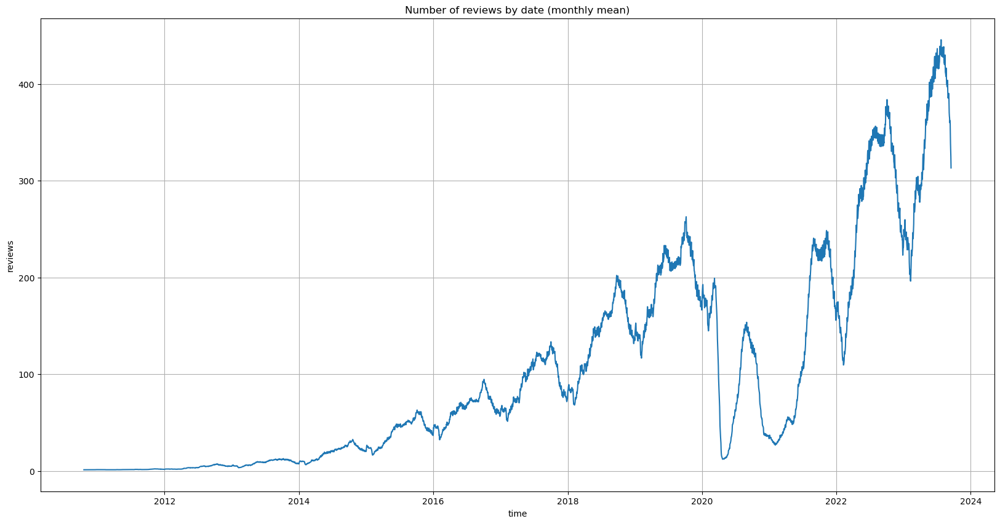

In [205]:
# Plot the number reviews over time to see any patterns
df_reviews_plot = df_reviews.groupby('date')['id'].count().reset_index()
df_reviews_plot["rolling_mean"] = df_reviews_plot.id.rolling(window = 30).mean()
df_reviews_plot['date'] = pd.to_datetime(df_reviews_plot['date'])

plt.figure(figsize=(20, 10));
plt.plot(df_reviews_plot.date, df_reviews_plot.rolling_mean);

plt.title("Number of reviews by date (monthly mean)");
plt.xlabel("time");
plt.ylabel("reviews");
plt.grid()


**Preparation for question 1**



**Question 1: "What is the most expensive time of the year to visit Berlin, and by how much do prices increase during this period?"**

In [3]:
# Copy the data to a new DataFrame for further clean up
df_calendar_clean = df_calendar.copy(deep=True)

In [4]:
# Clean up the data set "calendar" as the previous analysis pointed out
# Drop "adjusted_price"
df_calendar_clean = df_calendar_clean.drop("adjusted_price", axis=1)

# Remove missing values
df_calendar_clean.dropna(how='all', inplace=True)

# Convert the data type of feature 'date' from object to DateTime
df_calendar_clean['date'] = pd.to_datetime(df_calendar_clean['date'])

# clean up the format of the 'price' values
df_calendar_clean['price'] = df_calendar_clean['price'].replace({'\$': '', ',': ''}, regex = True).astype(float)

# Convert the feature 'available' to boolean data type
# (This conversion is actually not necessary for further analysis)
df_calendar_clean['available'] = df_calendar_clean['available'].replace({'t': True, 'f':False})

In [5]:
# Group the data by mean price per date
df_calendar_clean = df_calendar_clean.groupby('date')['price'].mean().reset_index()

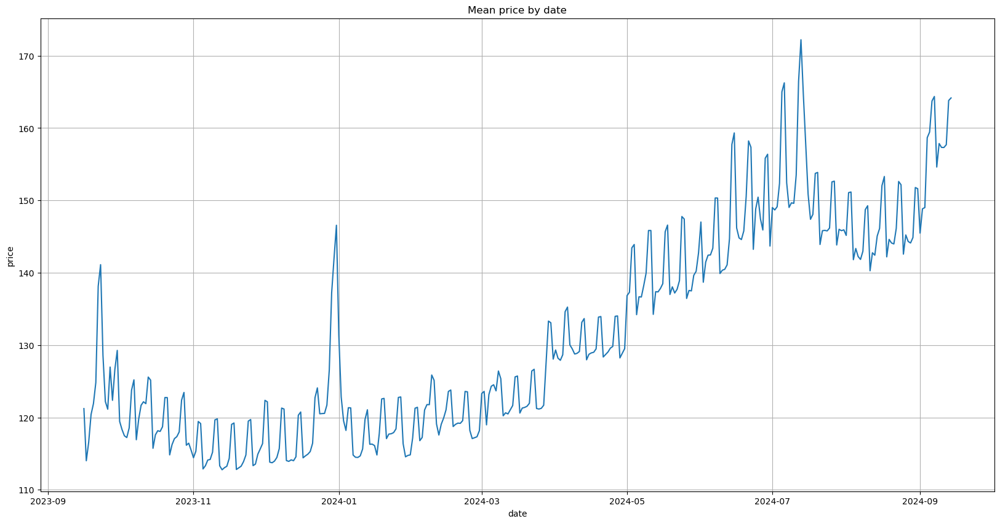

In [6]:
# Plot the mean price over time
plt.figure(figsize=(20, 10));
plt.plot(df_calendar_clean.date, df_calendar_clean.price);

plt.title("Mean price by date");
plt.xlabel("date");
plt.ylabel("price");
plt.grid();

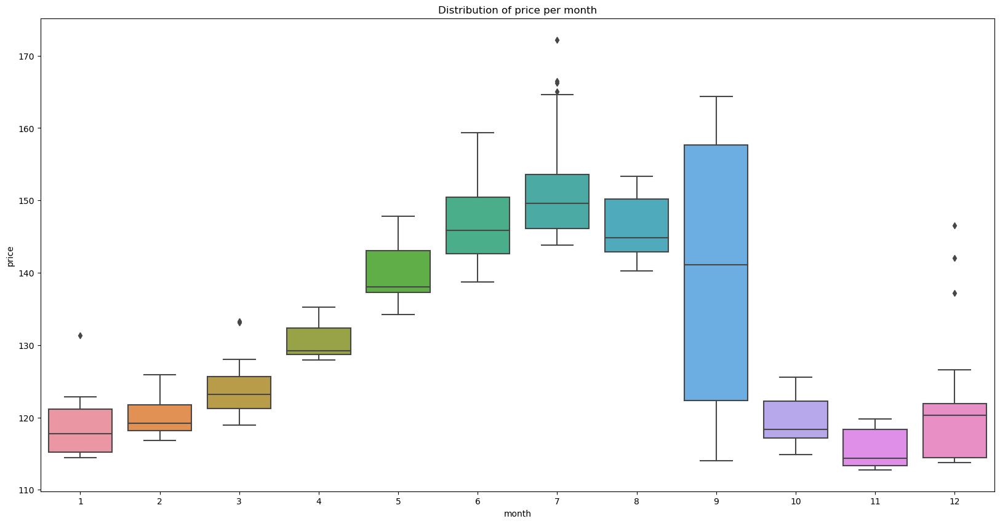

In [7]:
# Create a new feature 'month'
df_calendar_clean["month"] = df_calendar_clean["date"].dt.month

# Show a Boxplot to see the price distribution per month
plt.figure(figsize=(20, 10))
plt.title('Distribution of price per month');
sns.boxplot(x='month', y='price', data=df_calendar_clean);

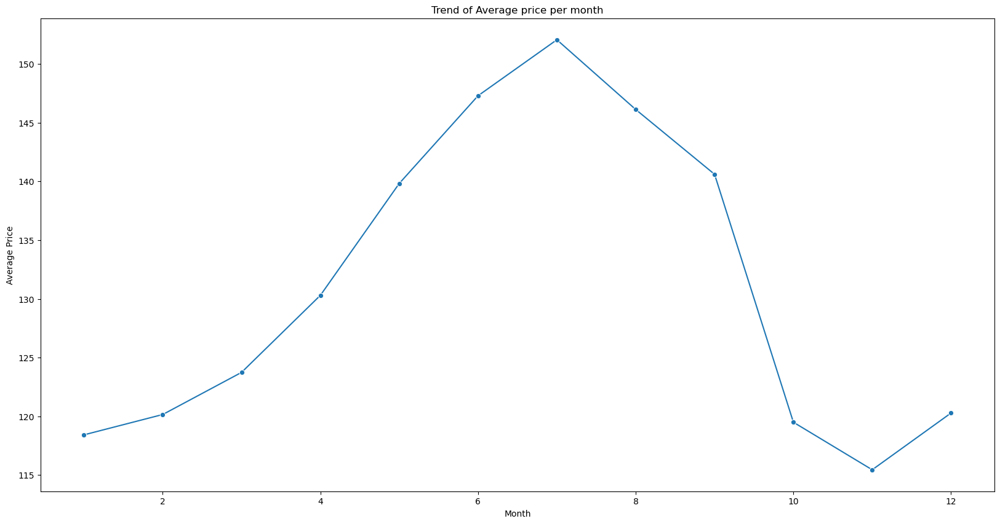

In [8]:
# Create a new feature 'month'
df_calendar_clean["month"] = df_calendar_clean["date"].dt.month

# Calculate average price per month
average_price_per_month = df_calendar_clean.groupby('month')['price'].mean().reset_index()

# Show a Lineplot to see the trend of average price per month
plt.figure(figsize=(20, 10))
plt.title('Trend of Average price per month')
sns.lineplot(x='month', y='price', data=average_price_per_month, marker='o')
plt.xlabel('Month')
plt.ylabel('Average Price')
plt.show()


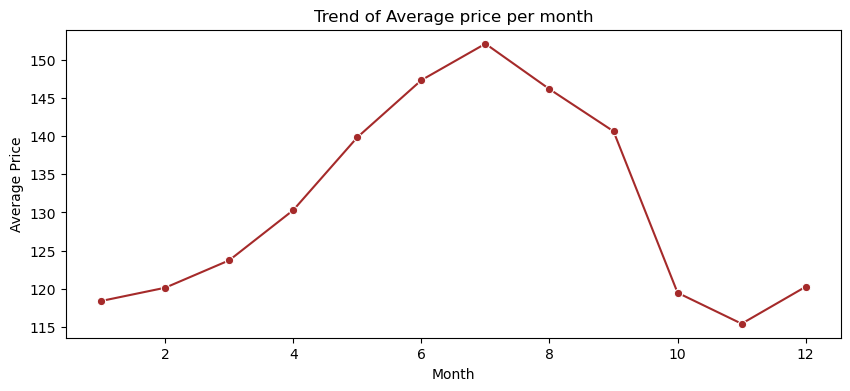

In [9]:
# Create a new feature 'month'
df_calendar_clean["month"] = df_calendar_clean["date"].dt.month

# Calculate average price per month
average_price_per_month = df_calendar_clean.groupby('month')['price'].mean().reset_index()

# Show a Lineplot to see the trend of average price per month
plt.figure(figsize=(10, 4))
plt.title('Trend of Average price per month')
sns.lineplot(x='month', y='price', data=average_price_per_month, marker='o', color='brown')
plt.xlabel('Month')
plt.ylabel('Average Price')
plt.show()


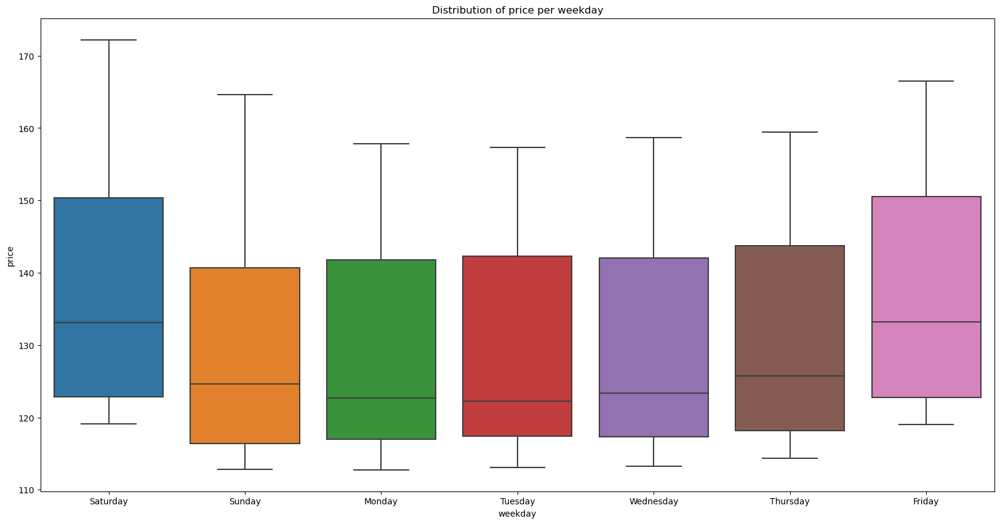

In [10]:
# Create a new feature 'weekday'
df_calendar_clean["weekday"] = df_calendar_clean["date"].dt.day_name()

# Show a Boxplot to see the price distribution per weekday
plt.figure(figsize=(20, 10))
plt.title('Distribution of price per weekday')
sns.boxplot(x='weekday', y='price', data=df_calendar_clean);

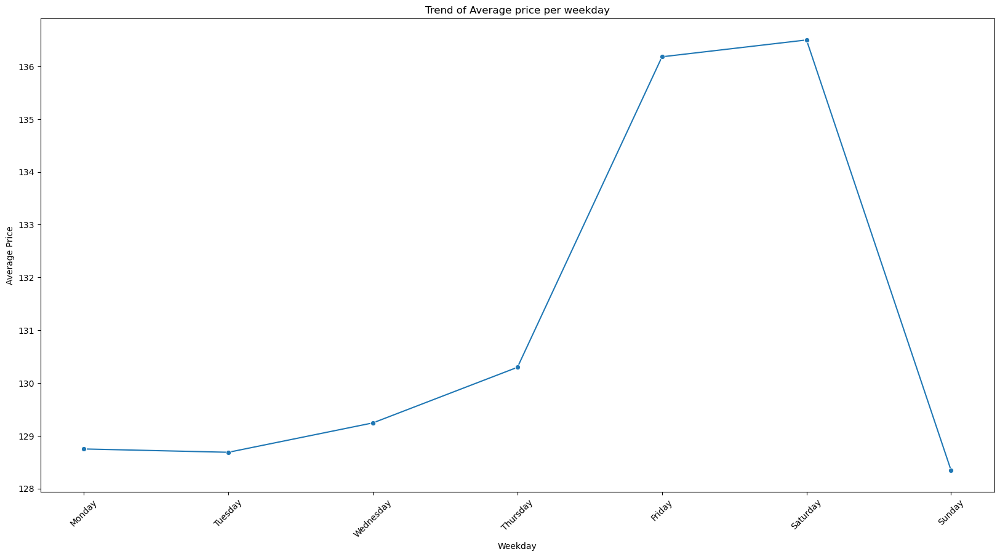

In [11]:
# Create a new feature 'weekday'
df_calendar_clean["weekday"] = df_calendar_clean["date"].dt.day_name()

# Define the order of weekdays for better visualization
weekday_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']

# Convert 'weekday' to a categorical type with the categories ordered
df_calendar_clean['weekday'] = pd.Categorical(df_calendar_clean['weekday'], categories=weekday_order, ordered=True)

# Calculate average price per weekday
average_price_per_weekday = df_calendar_clean.groupby('weekday')['price'].mean().reset_index()

# Show a Lineplot to see the trend of average price per weekday
plt.figure(figsize=(20, 10))
plt.title('Trend of Average price per weekday')
sns.lineplot(x='weekday', y='price', data=average_price_per_weekday, marker='o', sort=False)
plt.xlabel('Weekday')
plt.ylabel('Average Price')
plt.xticks(rotation=45)
plt.show()


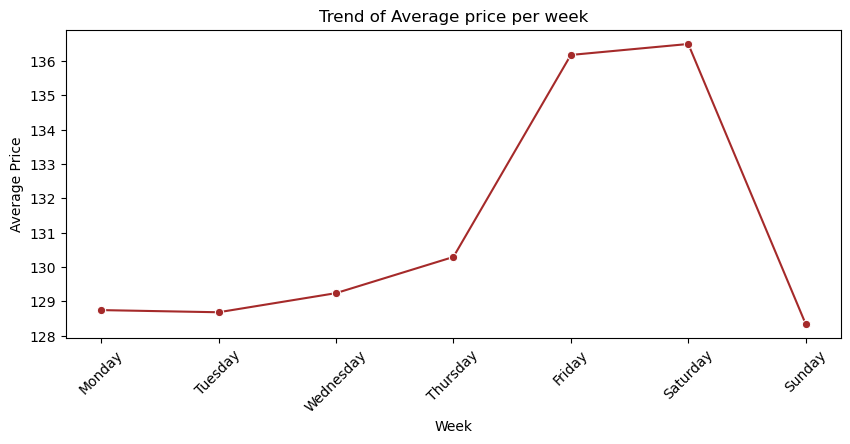

In [12]:
# Create a new feature 'weekday'
df_calendar_clean["week"] = df_calendar_clean["date"].dt.day_name()

# Define the order of weekdays for better visualization
week_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']

# Convert 'weekday' to a categorical type with the categories ordered
df_calendar_clean['week'] = pd.Categorical(df_calendar_clean['week'], categories=week_order, ordered=True)

# Calculate average price per weekday
average_price_per_week = df_calendar_clean.groupby('week')['price'].mean().reset_index()

# Show a Lineplot to see the trend of average price per weekday
plt.figure(figsize=(10, 4))
plt.title('Trend of Average price per week')
sns.lineplot(x='week', y='price', data=average_price_per_week, marker='o', color='brown', sort=False)
plt.xlabel('Week')
plt.ylabel('Average Price')
plt.xticks(rotation=45)
plt.show()


In [13]:
# Show the statistics per weekday
df_calendar_clean.groupby(['weekday'])['price'].describe()

,count,mean,std,min,25%,50%,75%,max
weekday,,,,,,,,
Monday,52.0,128.748715,13.702681,112.769682,116.949596,122.680600,141.791571,157.860798
Tuesday,52.0,128.685784,13.221891,113.057180,117.400792,122.257766,142.289877,157.324779
Wednesday,52.0,129.242877,13.497060,113.257347,117.342546,123.345287,141.996402,158.668748
Thursday,52.0,130.296584,13.682658,114.343688,118.197979,125.698759,143.723770,159.451721
Friday,52.0,136.180616,15.109370,119.043247,122.745622,133.232793,150.519453,166.455155
Saturday,53.0,136.499739,15.467006,119.156007,122.836227,133.088929,150.323968,172.202299
Sunday,52.0,128.344135,13.593389,112.809654,116.357050,124.605261,140.659928,164.613674


In [14]:
# Show the statistics per week of the year
df_calendar_clean["week"] = df_calendar_clean["date"].dt.isocalendar().week
df_calendar_clean.groupby(['week'])['price'].describe()

,count,mean,std,min,25%,50%,75%,max
week,,,,,,,,
1,7.0,121.347256,5.142443,114.805238,118.873610,121.322674,122.091023,131.373610
2,7.0,116.627466,2.681522,114.475179,114.596619,115.651287,118.006358,121.059845
3,7.0,118.189911,3.148824,114.813233,116.212921,117.076976,120.188062,122.637201
4,7.0,119.108497,2.597752,116.376961,117.725826,117.907111,120.593764,122.836227
5,7.0,117.255770,2.972300,114.561596,114.791952,116.789478,119.224912,121.405589
6,7.0,121.704812,3.060587,117.237323,120.073702,121.767245,123.456601,125.868509
7,7.0,120.533533,2.407511,117.572788,118.904408,119.916476,122.321875,123.792904
8,7.0,120.338532,2.245765,118.209304,119.118547,119.218898,121.553601,123.597229
9,7.0,119.383150,2.862340,117.079184,117.267969,118.171311,121.145767,123.604081


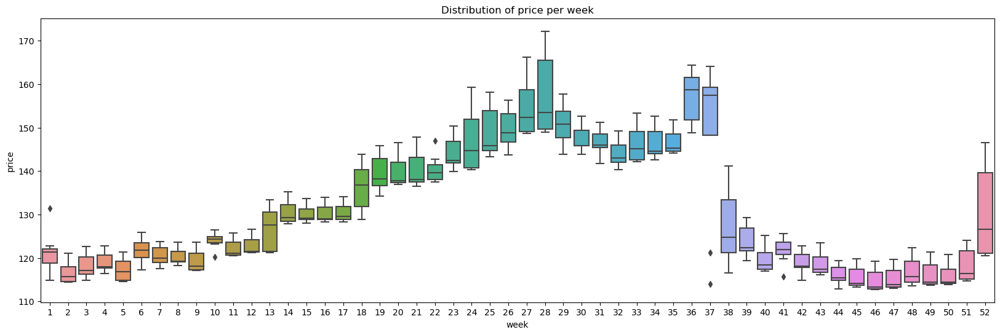

In [15]:
# Show a Boxplot to see the price distribution per week
plt.figure(figsize=(20, 6))
plt.title('Distribution of price per week')
sns.boxplot(x='week', y='price', data=df_calendar_clean);

**Summary of Question 1: "What is the most expensive time of the year to visit Berlin, and by how much do prices increase during this period?"**

Regardless of the location or other properties of the apartment, the following information results:

- There are some periods in the year in which the price differs significantly. Week 28(mean= 157), week 36(mean=156), week 46 and 47(mean= 115) and week 52(mean = 130)

a) In weeks 27 and 28, the price increases to about 175 USD. There is 29% increase price between week 1(Jan) and week 28 (July).There is also about 20% drop in price between week 28 and 52(Christmas), 37% between week 28 and week 46. 

- July in Berlin offers high-profile events such as Botanical Night, the Christopher Street Day Parade, the Komische Oper Festival and the Lesbian and Gay Festival. It looks like that has effect on Airbnb prices.
 
b) In week 36 and 37....., there are many events like Lollapalooza Festival, Musifest Berlin, Octoberfest(16th Sept - 3rd Oct 2023), BMW Berlin Marathon, International Stadium Festival etc.., could affect the price of airbnb.
 
c) In weeks 45 and 46 the price drops on average by 12% to ~115 USD. The international science, jazz, gastronomy and film scenes meet here this month of November. People also visit the first Christmas markets! The drop in price is not obvious and requires additional research.

- The mean price rises slightly at the weekends (Friday and Saturday). During the week the mean price is around  about 128 USD and on the weekend around ~136 USD; an increase of  about 6%.

- The price of apartments also rises during cetain times of the year. It is believed that both the german holidays and large events could have an impact on this.

- But this information cannot be obtained from the examined data set, and would needs additional analysis (e.g. in comparison with the holiday calendar)

**Answer:** The most expensive time of the year 2023 is mostly during the high-profile events such as Botanical Night, the Christopher Street Day Parade, the Komische Oper Festival and the Lesbian and Gay Festival. The mean price increases to about 43 USD between Jan(1st week) and July(28th week).

**Preparation for Question 2 and 3:**

**"Which neighborhoods in Berlin are the most expensive for Airbnb stays?" and "Which factors have the most influence on the price of Airbnb listings in Berlin?"**

In [16]:
# Copy the data to a new DataFrame for further clean up
df_listings_clean = df_listings.copy(deep=True)

In [17]:
df_listings_clean.head(2)

,id,listing_url,scrape_id,last_scraped,source,name,description,neighborhood_overview,picture_url,host_id,...,review_scores_communication,review_scores_location,review_scores_value,license,instant_bookable,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month
0,3176,https://www.airbnb.com/rooms/3176,20230916061000,2023-09-16,city scrape,Rental unit in Berlin · ★4.63 · 1 bedroom · 2 ...,This beautiful first floor apartment is situa...,The neighbourhood is famous for its variety of...,https://a0.muscache.com/pictures/243355/84afcf...,3718,...,4.69,4.92,4.62,First name and Last name: Nicolas Krotz <br/> ...,f,1,1,0,0,0.85
1,9991,https://www.airbnb.com/rooms/9991,20230916061000,2023-09-16,city scrape,Rental unit in Berlin · ★5.0 · 4 bedrooms · 7 ...,4 bedroom with very large windows and outstand...,Prenzlauer Berg is an amazing neighbourhood wh...,https://a0.muscache.com/pictures/42799131/59c8...,33852,...,5.00,4.86,4.86,03/Z/RA/003410-18,f,1,1,0,0,0.08


In [18]:
# Clean up the data set "listings" as the previous analysis pointed out

# Drop features which are not used further 
features_to_drop = ['listing_url', 'picture_url','host_url', 'host_thumbnail_url', 'host_picture_url',
                    'name', 'neighborhood_overview', 'neighbourhood', 'neighbourhood_cleansed', 'description', 'license', 'source', 'host_about',
                    'host_name', 'host_location', 'host_neighbourhood', 'last_scraped', 'host_verifications',
                    'calendar_last_scraped', 'first_review', 'last_review', 'host_since', 'calendar_updated',
                    'host_total_listings_count', 'scrape_id', 'host_is_superhost', 'instant_bookable']

df_listings_clean.drop(features_to_drop, axis=1, inplace=True)

In [19]:
# Drop columns with all missing values
df_listings_clean = df_listings_clean.dropna(axis=1, how='all')

# Drop rows where 'id' is missing (assuming 'id' is a key identifier)
df_listings_clean = df_listings_clean.dropna(subset=['id'])

# Drop columns with more than 50% missing values
threshold = 0.5
df_listings_clean = df_listings_clean.dropna(thresh=len(df_listings_clean) * (1 - threshold), axis=1)

# Impute missing values for numerical columns with mean
numerical_columns = df_listings_clean.select_dtypes(include=np.number).columns
imputer = SimpleImputer(strategy='mean')
df_listings_clean[numerical_columns] = imputer.fit_transform(df_listings_clean[numerical_columns])

# Impute missing values for categorical columns with mode
categorical_columns = df_listings_clean.select_dtypes(include='object').columns
imputer_mode = SimpleImputer(strategy='most_frequent')
df_listings_clean[categorical_columns] = imputer_mode.fit_transform(df_listings_clean[categorical_columns])

# Convert percentage columns to numeric
percentage_columns = ['host_response_rate', 'host_acceptance_rate']
df_listings_clean[percentage_columns] = df_listings_clean[percentage_columns].replace('%', '', regex=True).astype(float) / 100

# Remove non-numeric characters from the 'price' column
df_listings_clean['price'] = df_listings_clean['price'].replace('[\$,]', '', regex=True).astype(float)

# Remove outliers of the feature 'price" - drop all higher than 90% quantile
outliers = df_listings_clean["price"].quantile(0.90)
df_listings_clean = df_listings_clean[df_listings_clean["price"] < outliers]

# Drop duplicates
df_listings_clean = df_listings_clean.drop_duplicates()

# Reset index
df_listings_clean = df_listings_clean.reset_index(drop=True)


In [20]:
#Rename 'neighbourhood_group_cleansed' to 'neighbourhood'
df_listings_clean.rename(columns={'neighbourhood_group_cleansed': 'neighbourhood'}, inplace=True)


In [21]:
#Rename df_listings_clean
df_listings_clean1 = df_listings_clean

In [22]:
# Remove constant features by finding unique values per feature 
df_listings_clean1 = df_listings_clean1[df_listings_clean1.nunique().where(df_listings_clean1.nunique()!=1).dropna().keys()]

In [23]:
# Remove all remaining missing values  
df_listings_clean1.dropna(inplace=True)

In [24]:
# Show price statistic for each neighbourhood  
df_listings_clean1.groupby(["neighbourhood"])["price"].describe()

,count,mean,std,min,25%,50%,75%,max
neighbourhood,,,,,,,,
Charlottenburg-Wilm.,1077.0,95.325905,52.595290,10.0,54.00,85.0,130.00,227.0
Friedrichshain-Kreuzberg,2620.0,89.009924,51.831201,8.0,49.00,79.0,120.00,227.0
Lichtenberg,325.0,80.532308,50.956315,10.0,40.00,67.0,110.00,226.0
Marzahn - Hellersdorf,100.0,72.060000,42.737115,12.0,38.75,63.0,91.25,210.0
Mitte,2355.0,95.264119,55.530093,10.0,50.00,85.0,130.00,227.0
Neukölln,1495.0,73.437458,44.467547,9.0,40.00,61.0,96.00,226.0
Pankow,1844.0,93.163232,50.920319,9.0,52.00,80.0,125.00,226.0
Reinickendorf,199.0,71.879397,42.715355,10.0,45.00,59.0,95.00,217.0
Spandau,197.0,50.197970,52.454318,10.0,12.00,25.0,69.00,220.0


In [25]:
# Create new feature 'mean' with the mean price per neighbourhood
df_listings_clean1['mean'] = df_listings_clean1.groupby('neighbourhood')['price'].transform('mean')


In [26]:
# Create new feature 'mean' with the mean price per neighbourhood
#df_listings_clean['mean'] = df_listings_clean.groupby('neighbourhood_cleansed')['price'].transform(lambda r : r.mean())

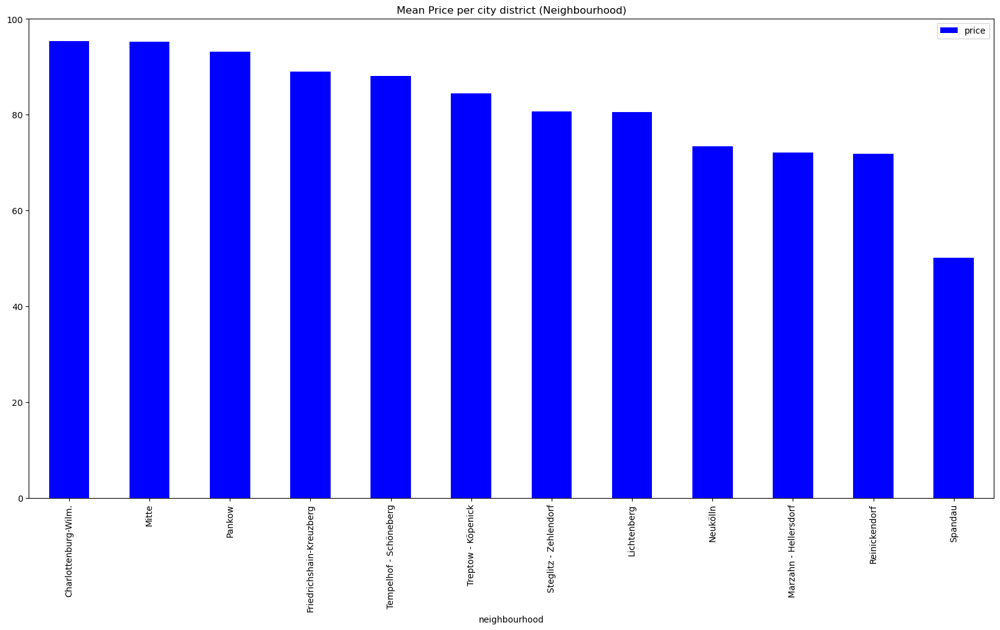

In [27]:
# Create plot for mean price per neighbourhood 
df_listings_plot = df_listings_clean1
df_listings_plot = df_listings_plot.groupby('neighbourhood')[['price']].mean()
df_listings_plot = df_listings_plot.reset_index()
df_listings_plot = df_listings_plot.sort_values(by='price',ascending=False)
df_listings_plot.plot.bar(x='neighbourhood', y='price', color='blue', rot=90, figsize = (20,10)).set_title('Mean Price per city district (Neighbourhood)');

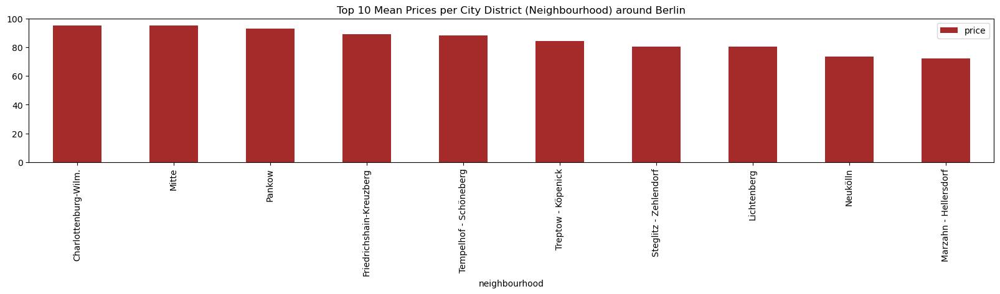

In [28]:

# Create plot for mean price per neighbourhood 
df_listings_plot = df_listings_clean1.groupby('neighbourhood')[['price']].mean()
df_listings_plot = df_listings_plot.reset_index()
df_listings_plot = df_listings_plot.sort_values(by='price', ascending=False).head(10)  # Filter top 10 rows

# Create a gradient of colors from blue to red
colors = plt.cm.viridis(np.linspace(0, 1, 10))

df_listings_plot.plot.bar(x='neighbourhood', y='price', color= 'brown', figsize=(20, 3))
plt.title('Top 10 Mean Prices per City District (Neighbourhood) around Berlin')
plt.show()

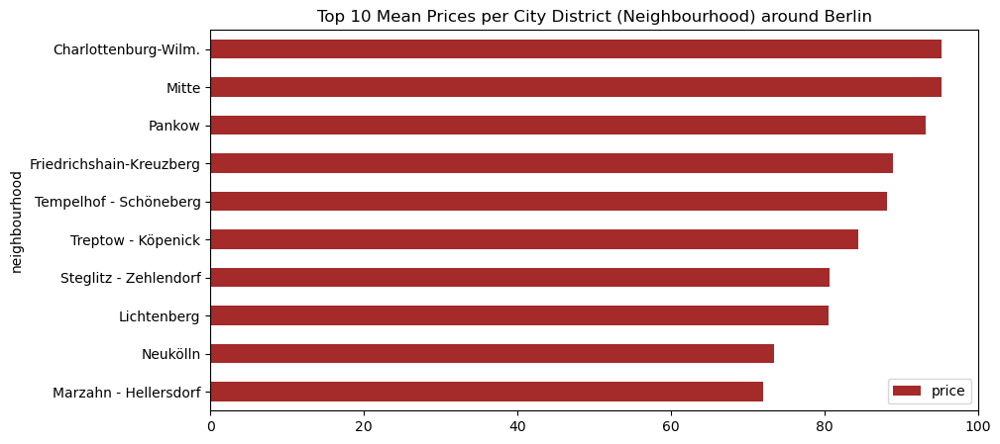

In [29]:
# Create plot for mean price per neighbourhood 
df_listings_plot = df_listings_clean1.groupby('neighbourhood')[['price']].mean()
df_listings_plot = df_listings_plot.reset_index()
df_listings_plot = df_listings_plot.sort_values(by='price', ascending=False).head(10)  # Filter top 6 rows

# Adjust the plot to be vertical
df_listings_plot.plot.barh(x='neighbourhood', y='price', color='brown', figsize=(10, 5))
plt.title('Top 10 Mean Prices per City District (Neighbourhood) around Berlin')
plt.gca().invert_yaxis()  # Invert y-axis to have the neighbourhood with the highest mean price at the top


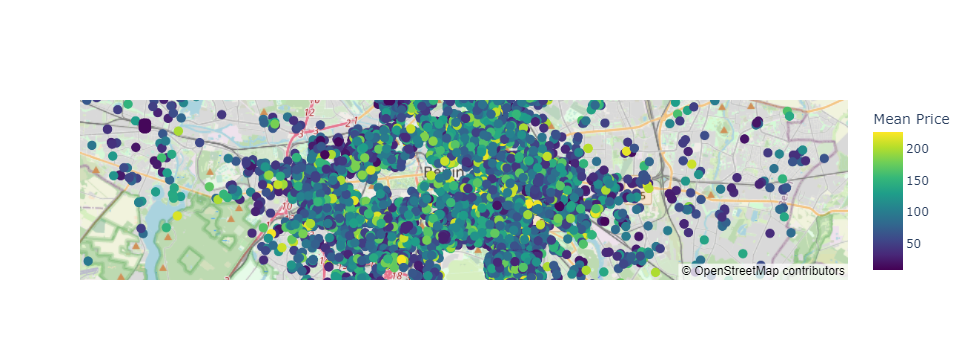

In [30]:
import plotly.graph_objects as go

# Set up the layout for the map
layout = go.Layout(
    mapbox=dict(
        style="open-street-map",
        center=dict(
            lat=df_listings_clean1['latitude'].mean(),
            lon=df_listings_clean1['longitude'].mean()
        ),
        zoom=10,
    )
)

# Create the scatter_mapbox trace
scatter_map = go.Scattermapbox(
    lat=df_listings_clean1['latitude'],
    lon=df_listings_clean1['longitude'],
    mode='markers',
    marker=dict(
        size=10,
        color=df_listings_clean1['price'],
        colorscale='Viridis',
        colorbar=dict(title='Mean Price')
    ),
    text=df_listings_clean1['neighbourhood']
)

# Create the figure
fig = go.Figure(data=[scatter_map], layout=layout)

# Show the figure
fig.show()


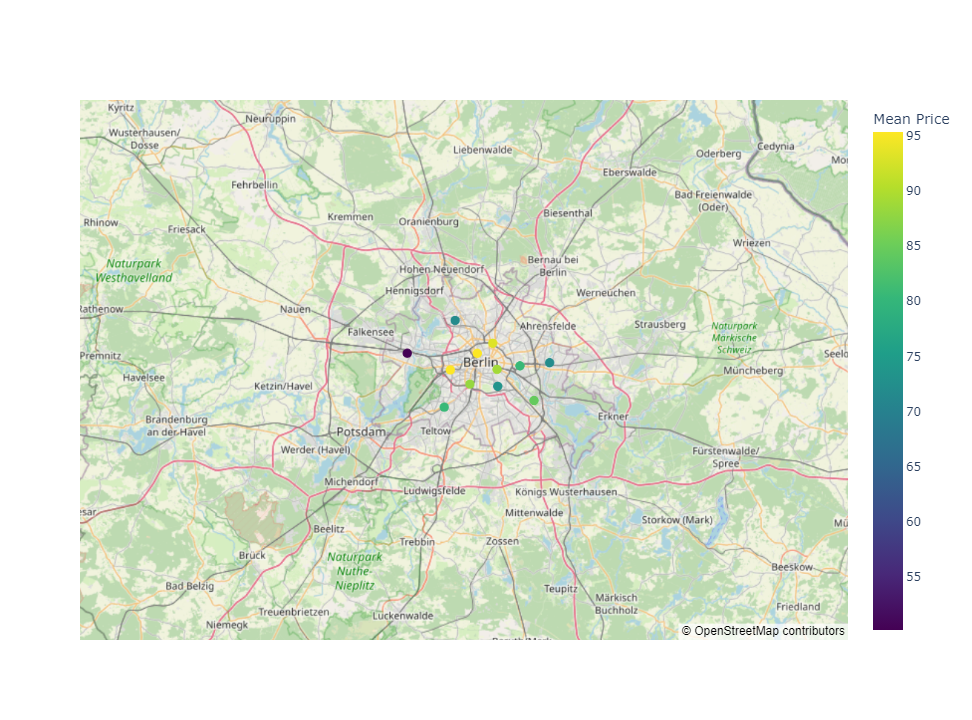

In [42]:
import plotly.graph_objects as go

#Visualize the top 10
df_listings_plot = df_listings_clean1.groupby('neighbourhood')[['price', 'latitude', 'longitude']].mean().reset_index()

# Set up the layout for the map
layout = go.Layout(
    mapbox=dict(
        style="open-street-map",
        center=dict(
            lat=df_listings_plot['latitude'].mean(),
            lon=df_listings_plot['longitude'].mean()
        ),
        zoom=10,
    )
)

# Create the scatter_mapbox trace
scatter_map = go.Scattermapbox(
    lat=df_listings_plot['latitude'],
    lon=df_listings_plot['longitude'],
    mode='markers',
    marker=dict(
        size=10,
        color=df_listings_plot['price'],
        colorscale='Viridis',
        colorbar=dict(title='Mean Price')
    ),
    text=df_listings_plot['neighbourhood']
)

# Create the figure
fig = go.Figure(data=[scatter_map], layout=layout)

# Show the figure
fig.show()


**Summary for Question 2: "Which neighborhoods in Berlin are the most expensive for Airbnb stays?"**

From the analysis, there is a clear difference in the costs between the different neighbourhoods in . In general - the closer the apartment is to the city center or the Berlin, the higher the price. Furthermore the outliers must also be taken into account, since there are individual apartments in which the price deviates considerably.

**Answer: The TOP 10 expensive neighbourhoods in Berlin are:**

- Charlottenburg-Wilm
- Mitte
- Pankow
- Friedrichshain-Kreuzberg
- Tempelhof-Schöneberg
- Treptow-Köpenick
- Steglitz-Zehlendorf
- Lichtenberg
- Neukölln
- Marzahn-Hellersdorf

**Modeling**

In [33]:
# Copy the data to a new DataFrame for encoding 
df_listings_encoded = df_listings_clean.copy(deep=True)

In [74]:
# Show the remaining features and the data type
df_listings_encoded.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11817 entries, 0 to 11816
Data columns (total 47 columns):
 #   Column                                        Non-Null Count  Dtype  
---  ------                                        --------------  -----  
 0   id                                            11817 non-null  float64
 1   host_id                                       11817 non-null  float64
 2   host_response_time                            11817 non-null  object 
 3   host_response_rate                            11817 non-null  float64
 4   host_acceptance_rate                          11817 non-null  float64
 5   host_listings_count                           11817 non-null  float64
 6   host_has_profile_pic                          11817 non-null  object 
 7   host_identity_verified                        11817 non-null  object 
 8   neighbourhood                                 11817 non-null  object 
 9   latitude                                      11817 non-null 

In [34]:
# Encode features for use in machine learning model

# Encode feature 'amenities' and concat the data
df_listings_encoded.amenities = df_listings_encoded.amenities.str.replace('[{""}]', "", regex=True)
df_amenities = df_listings_encoded.amenities.str.get_dummies(sep=",")
df_listings_encoded = pd.concat([df_listings_encoded, df_amenities], axis=1)


# Encode feature 'host_response_time'
dict_response_time = {'within an hour': 1, 'within a few hours': 2, 'within a day': 3, 'a few days or more': 4}
df_listings_encoded['host_response_time'] = df_listings_encoded['host_response_time'].map(dict_response_time)

# Encode the remaining categorical features
for categorical_feature in ['host_response_time', 'host_has_profile_pic', 'host_identity_verified',
                         'neighbourhood', 'property_type', 'room_type',
                         'bathrooms_text', 'amenities', 'has_availability']:
    df_listings_encoded = pd.concat([df_listings_encoded, pd.get_dummies(df_listings_encoded[categorical_feature])], axis=1)


In [35]:
# Check if there are any missing values in the data set
sum(df_listings_encoded.isnull().sum())

0

In [77]:
# Assuming df_listings_encoded is your DataFrame
df_listings_encoded = df_listings_encoded.loc[:,~df_listings_encoded.columns.duplicated()]


In [36]:
# Drop 'id' column 
df_listings_encoded = df_listings_encoded.drop(columns=['id'])


In [103]:
# Convert the "price" column to numeric by removing the currency symbol ('$')
df_listings_encoded['price'] = df_listings_encoded['price'].replace('[\$,]', '', regex=True).astype(float)

# Split the data into features and target and drop some features
#X = df_listings_encoded.drop("price", axis=1)
X = df_listings_encoded.drop(["host_identity_verified","host_has_profile_pic", "latitude", "longitude", "price"], axis=1)
y = df_listings_encoded["price"]

In [104]:
# Import necessary libraries
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OneHotEncoder
from catboost import CatBoostRegressor
from sklearn.metrics import r2_score
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer

# Convert all feature names to strings
X.columns = X.columns.astype(str)

# Identify numerical and categorical columns
numerical_cols = X.select_dtypes(include=['float64', 'int64']).columns
categorical_cols = X.select_dtypes(include=['object']).columns

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Create a column transformer with OneHotEncoder for categorical columns
preprocessor = ColumnTransformer(
    transformers=[
        ('num', SimpleImputer(strategy='mean'), numerical_cols),
        ('cat', OneHotEncoder(handle_unknown='ignore'), categorical_cols)
    ])

# Create a CatBoostRegressor model with verbose=False
model = CatBoostRegressor(iterations=100, depth=10, learning_rate=0.05, loss_function='RMSE', verbose=False)

# Create a pipeline with preprocessing and modeling steps
pipeline = Pipeline(steps=[('preprocessor', preprocessor),
                             ('model', model)])

# Fit the pipeline on the training data
pipeline.fit(X_train, y_train)

# Make predictions on the training set and calculate R^2 score
y_pred_train = pipeline.predict(X_train)
r2_train = r2_score(y_train, y_pred_train)
print("Training Set:")
print("R^2 Score:", round(r2_train, 2))

# Make predictions on the test set and calculate R^2 score
y_pred_test = pipeline.predict(X_test)
r2_test = r2_score(y_test, y_pred_test)
print("\nTest Set:")
print("R^2 Score:", round(r2_test, 2))


Training Set:
R^2 Score: 0.73

Test Set:
R^2 Score: 0.68


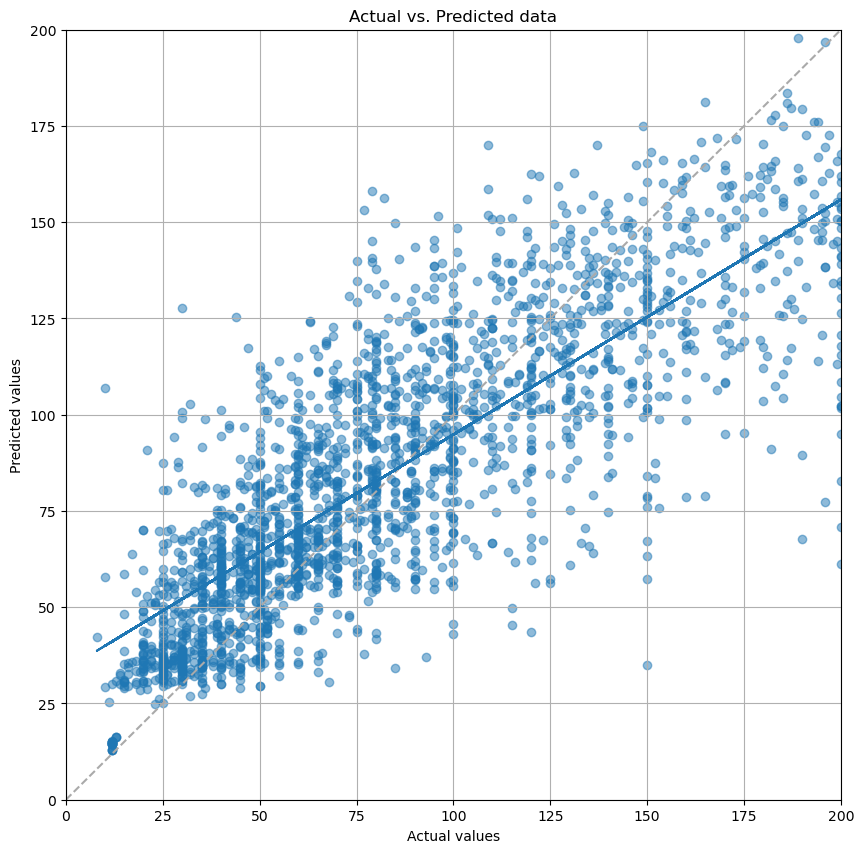

In [105]:
# Scatter plot of th actual vs predicted data
plt.figure(figsize=(10, 10))
plt.grid()
plt.xlim((0, 200))
plt.ylim((0, 200))
plt.plot([0,200],[0,200], color='#AAAAAA', linestyle='dashed')
plt.scatter(y_test, y_pred_test, alpha=0.5)
coef = np.polyfit(y_test,y_pred_test,1)
poly1d_fn = np.poly1d(coef) 
plt.plot(y_test, poly1d_fn(y_test))
plt.title('Actual vs. Predicted data');
plt.xlabel("Actual values")
plt.ylabel("Predicted values")
plt.show()

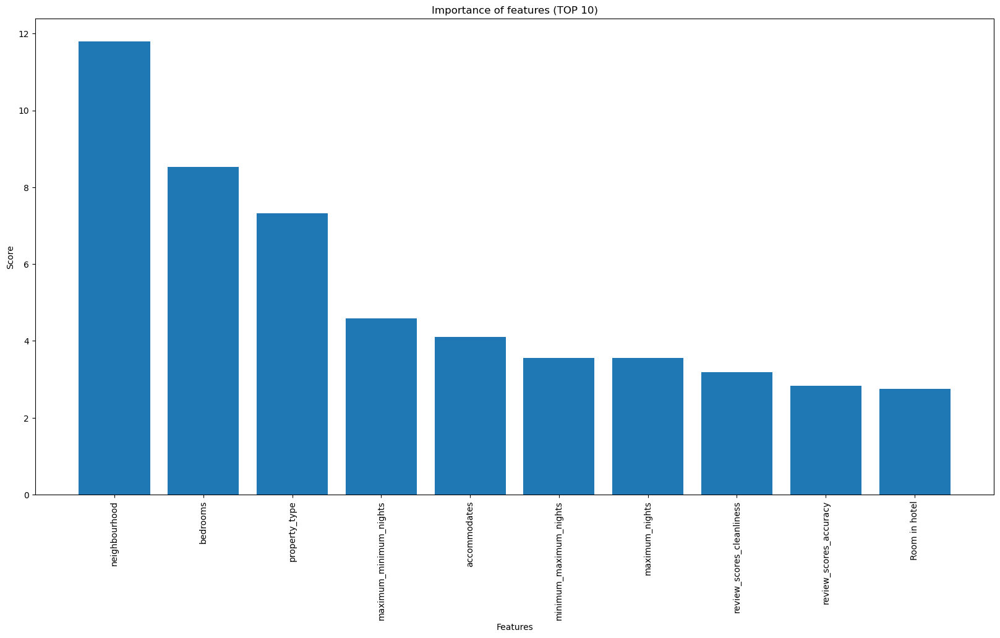

In [106]:
# Sort the importance of the features
importances = model.feature_importances_

values = sorted(zip(X_train.columns, model.feature_importances_), key=lambda x: x[1] * -1)
feature_importances = pd.DataFrame(values, columns=["feature", "score"])
feature_importances = feature_importances.sort_values(by=['score'], ascending=False)

features = feature_importances['feature'][:10]
y_feature = np.arange(len(features))
score = feature_importances['score'][:10]

# Plot the importance of a feature to the price
plt.figure(figsize=(20, 10));
plt.bar(y_feature, score, align='center');
plt.xticks(y_feature, features, rotation='vertical');
plt.xlabel('Features');
plt.ylabel('Score');
plt.title('Importance of features (TOP 10)');
plt.show()

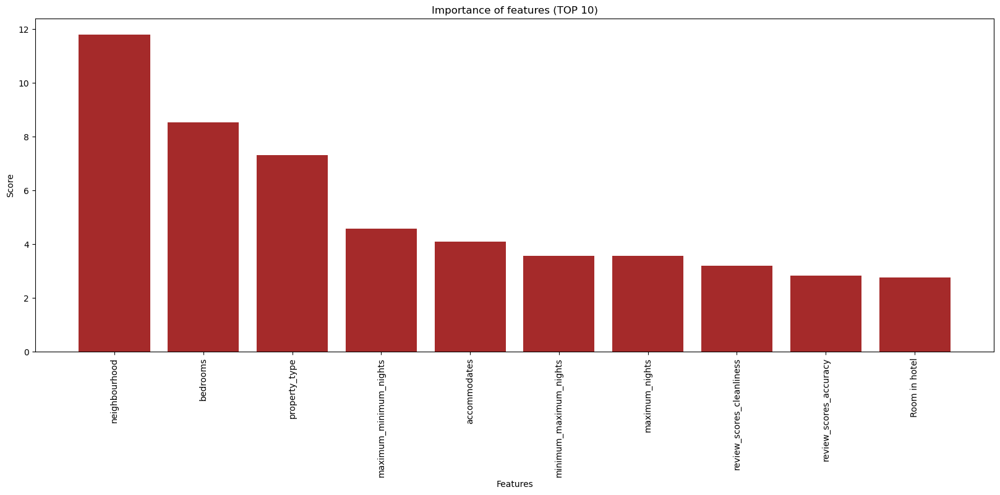

In [107]:
# Sort the importance of the features
importances = model.feature_importances_

values = sorted(zip(X_train.columns, model.feature_importances_), key=lambda x: x[1] * -1)
feature_importances = pd.DataFrame(values, columns=["feature", "score"])
feature_importances = feature_importances.sort_values(by=['score'], ascending=False)

features = feature_importances['feature'][:10]
y_feature = np.arange(len(features))
score = feature_importances['score'][:10]

# Plot the importance of a feature to the price
plt.figure(figsize=(20, 7));
plt.bar(y_feature, score, align='center', color='brown');  # Change color here
plt.xticks(y_feature, features, rotation='vertical');
plt.xlabel('Features');
plt.ylabel('Score');
plt.title('Importance of features (TOP 10)');
plt.show()


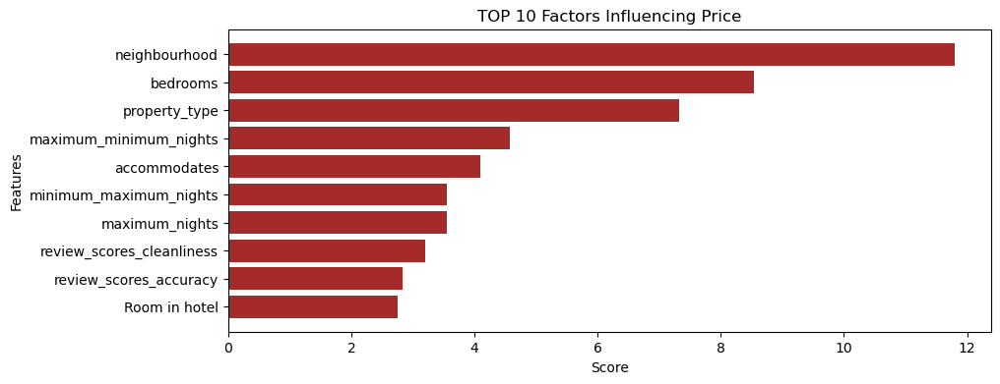

In [116]:
# Sort the importance of the features
importances = model.feature_importances_

values = sorted(zip(X_train.columns, model.feature_importances_), key=lambda x: x[1] * -1)
feature_importances = pd.DataFrame(values, columns=["feature", "score"])
feature_importances = feature_importances.sort_values(by=['score'], ascending=False)

features = feature_importances['feature'][:10]
y_feature = np.arange(len(features))
score = feature_importances['score'][:10]

# Plot the importance of a feature to the price
plt.figure(figsize=(10, 4));  # Adjust figure size for vertical plot
plt.barh(y_feature, score, align='center', color='brown');  # Use plt.barh() for horizontal bars
plt.yticks(y_feature, features);  # Use plt.yticks() to set y-axis tick values and labels
plt.ylabel('Features');  # Swap x and y labels
plt.xlabel('Score');
plt.title('TOP 10 Factors Influencing Price');
plt.gca().invert_yaxis()  # Invert y-axis to have highest importance at the top
plt.show()


**Summary for Question 3: "Which factors have the most influence on the price of Airbnb listings in Berlin?"**

With a coefficient of determination (R^2) of 0.73, the model and the prediction seems accurate enough to predict the price of an apartment.

**Answer:**

The TOP 5 factors of an apartment that have the greatest influence on the price are:

- Neighbourhood: (The location of apartment influence price. If apartment is close to the city center, prices would be high and vice versa)

- Bedrooms: (The number of bedrooms)

- Property Type

- Minimum/maximum nights 

- Accomodates: The maximum number of guest that a property can accommodate